<h4>Overhand Fitness briefing to Interns - October 2nd</h4>  

Step One: <h4>Data I/O, import datasets</h4>     

In [1]:
import pandas as pd 
import csv 

def loadfile(filename):
    list_sensors=['gyroX','gyroY','gyroZ',
                  'lowAccelX','lowAccelY','lowAccelZ', 
                  'highAccelX','highAccelY','highAccelZ'] 
    f = open(filename,'rt')
    remove_trackerName= [line.replace('T7L,', "") for line in f.readlines()]
    file_as_list= [[token.split(',') for token in line.split(';')] 
                   for line in remove_trackerName][0]
    file_as_list=sum([l for l in file_as_list], []) 
    chunks= [file_as_list[i:i+9] for i in range(0,len(file_as_list),9)]
    data=pd.DataFrame(chunks).apply(pd.to_numeric, errors='coerce')
    data.columns=list_sensors 
    return data 

PATH= 'desktop/fitness/' 
biceps_curls1=loadfile(PATH+'biceps_curls/biceps_curls_10-T7L-1531913275450.txt')  
biceps_curls2=loadfile(PATH+'biceps_curls/biceps_curls_10-T7L-1531913463782.txt')
biceps_curls3=loadfile(PATH+'biceps_curls/biceps_curls_10-T7L-1531913706454.txt')
biceps_curls= biceps_curls1.append([biceps_curls2, biceps_curls3]) 
bs=biceps_curls.fillna(biceps_curls.median())
jumping_jacks1= loadfile(PATH+'jumping_jacks/jumping_jacks_fast_20-T7L-1531551391007.txt')
jumping_jacks2=loadfile(PATH+'jumping_jacks/jumping_jacks_mediumspeed_20-T7L-1531551366385.txt') 
jumping_jacks3=loadfile(PATH+'jumping_jacks/jumping_jacks_slow_20-T7L-1531551326547.txt') 
jumping_jacks= jumping_jacks1.append([jumping_jacks2, jumping_jacks3]) 
jj=jumping_jacks.fillna(jumping_jacks.median()) 

<h4>train_split_test data and use the cross validation</h4> 

In [2]:
bs['activity']= 0
jj['activity']= 1
X_biceps= bs.iloc[:,:9] 
y_biceps=bs.iloc[:,9:]
X_jumping=jj.iloc[:, :9]
y_jumping= jj.iloc[:,9:] 

from sklearn.cross_validation import train_test_split 
from sklearn import cross_validation
X_train_biceps, X_test_biceps, y_train_biceps, y_test_biceps= cross_validation.train_test_split(X_biceps, y_biceps, test_size=0.3)
X_train_jumping, X_test_jumping, y_train_jumping, y_test_jumping= cross_validation.train_test_split(X_jumping, y_jumping, test_size=0.3)  

print(X_train_biceps.shape, 
      X_test_biceps.shape, 
      X_train_jumping.shape, 
      X_test_jumping.shape)    
y_train=y_train_jumping.append(y_train_biceps) 
y_test= y_test_jumping.append(y_test_biceps)  
X_train_biceps.tail()  

(7527, 9) (3226, 9) (4608, 9) (1975, 9)


/Applications/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


,gyroX,gyroY,gyroZ,lowAccelX,lowAccelY,lowAccelZ,highAccelX,highAccelY,highAccelZ
1326,673.0,439.0,-290.0,-352.0,2018.0,156.0,-435.0,601.0,415.0
1265,50.0,-346.0,-8.0,-252.0,2058.0,416.0,-425.0,605.0,441.0
2671,261.0,223.0,-204.0,-356.0,2298.0,12.0,-435.0,629.0,401.0
1634,-1430.0,-56.0,-3446.0,-1040.0,2602.0,408.0,-504.0,660.0,440.0
2724,-1902.0,-786.0,-3164.0,-916.0,-490.0,-332.0,-491.0,351.0,367.0


<h4>transform the format data so that they can change in the same scope, useful for the mean and std for variance</h4> 

In [3]:
#Standardization 
from sklearn.preprocessing import StandardScaler
columns= ['gyroX','gyroY','gyroZ',
        'lowAccelX','lowAccelY','lowAccelZ', 
        'highAccelX','highAccelY','highAccelZ']  
std= StandardScaler() #it's never hurt to standardize the features before applying modeling especailly PCA 
X_train_biceps_std= std.fit_transform(X_train_biceps) 
X_test_biceps_std= std.transform(X_test_biceps) 

X_train_jumping_std=std.fit_transform(X_train_jumping)
X_test_jumping_std= std.transform(X_test_jumping) 

X_train_biceps_std= pd.DataFrame(X_train_biceps_std, columns=columns) 
X_train_jumping_std=pd.DataFrame(X_train_jumping_std,columns=columns)  

X_test_biceps_std= pd.DataFrame(X_test_biceps_std, columns=columns) 
#transform to dataframe, can use df.values to inverse to numpy.array 
X_test_jumping_std=(pd.DataFrame(X_test_jumping_std,columns=columns))

X_train_std= pd.concat([X_train_biceps_std, X_train_jumping_std])  
X_test_std= pd.concat([X_test_biceps_std, X_test_jumping_std])    
print(X_train_std.shape, X_test_std.shape)  

(12135, 9) (5201, 9)


<h4>Data exploration by visuzlization</h4>  

In [4]:
%matplotlib inline 
import matplotlib.pyplot as plt 
import cufflinks as cf
cf.go_offline()
cf.set_config_file(theme='white')
x= pd.DataFrame(X_train_jumping)
x.iplot() 

In [5]:
x= pd.DataFrame(X_train_biceps_std)
x.iplot() #can predicate the direction to classifer the activity  

In [6]:
x= pd.DataFrame(X_train_jumping_std)
x.iplot() 

<h4>use Random Forest for the algorithm testing with simple dataset, 
<li>taining the model on the training data, make the prediction on test data</li>
<li>Compare predictions to the known test set targets and calculate performance metrics</li>
<li>If performance is not satisfactory, adjust the model, acquire more data, or try a different modeling technique</li>
</h4>    

In [7]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=500,
                                random_state=101,
                                oob_score=True,
                                n_jobs=2)
forest.fit(X_train_std, np.ravel(y_train))  

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=2,
            oob_score=True, random_state=101, verbose=0, warm_start=False)

In [8]:
importances=forest.feature_importances_ 
importances #all the features don't have huge difference, so we can keep all of them 

array([0.10337624, 0.08940255, 0.10287595, 0.11375217, 0.12829906,
       0.10822288, 0.11848918, 0.12026402, 0.11531794])

In [9]:
forest.estimators_ 

[DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
             max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, presort=False,
             random_state=70431583, splitter='best'),
 DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
             max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, presort=False,
             random_state=225658379, splitter='best'),
 DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
             max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weigh

In [10]:
forest.decision_path  

<bound method BaseForest.decision_path of RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=2,
            oob_score=True, random_state=101, verbose=0, warm_start=False)>

In [11]:
forest.predict_proba(X_test_std)

array([[0.394     , 0.606     ],
       [0.45      , 0.55      ],
       [0.39546667, 0.60453333],
       ...,
       [0.996     , 0.004     ],
       [1.        , 0.        ],
       [0.998     , 0.002     ]])

In [12]:
y_pred=forest.predict(X_test_std) 
y_pred 

array([1, 1, 1, ..., 0, 0, 0])

In [13]:
from sklearn import metrics
print(metrics.accuracy_score(y_test,y_pred))   #mean accuracy 

0.7238992501442031


In [14]:
forest.oob_score_  

0.7246806757313555

In [15]:
from sklearn.metrics import confusion_matrix
print(metrics.confusion_matrix(y_test, y_pred)) 

[[2298  928]
 [ 508 1467]]


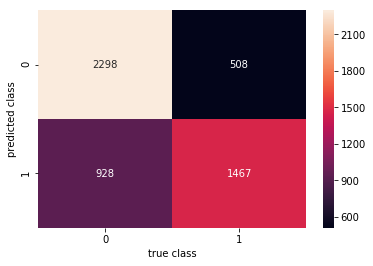

In [16]:
import seaborn as sns
mat = confusion_matrix(y_test, y_pred)
sns.heatmap(mat.T, square=False, annot=True, fmt='d', cbar=True)
plt.xlabel('true class')
plt.ylabel('predicted class');  

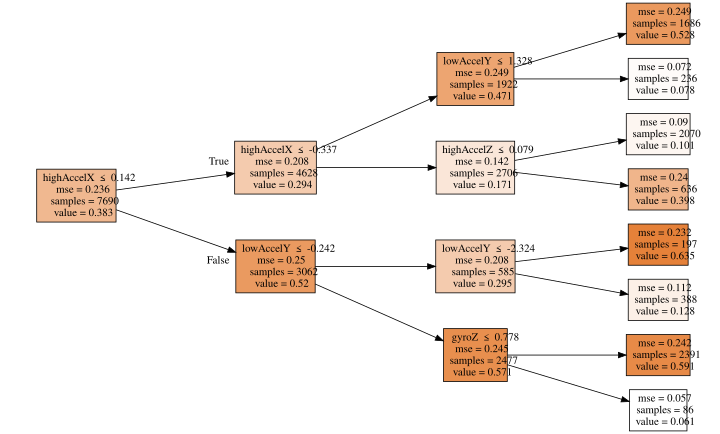

In [17]:
from fastai.structured import draw_tree
from sklearn.ensemble import RandomForestRegressor #decison tree 

m = RandomForestRegressor(n_estimators=10, max_depth=3, bootstrap=True, n_jobs=-1)
m.fit(X_train_std, np.ravel(y_train)) 
draw_tree(m.estimators_[0], X_train_std, precision=3)  

<h4>use SVM</h4> 

In [18]:
from sklearn.svm import SVC
svm = SVC(kernel='rbf', C=1.0) 
svm.fit(X_train_std, np.ravel(y_train))  

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [19]:
svm.decision_function(X_train_std)   

array([ 0.63235,  0.9966 ,  0.49554, ..., -1.25287, -1.43096, -1.28138])

In [20]:
svm.score(X_train_std,y_train) 

0.7593737124021426

In [21]:
y_pred_svm= svm.predict(X_test_std) 
metrics.accuracy_score(y_test,y_pred_svm)  

0.7529321284368391

/Applications/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning:

pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead



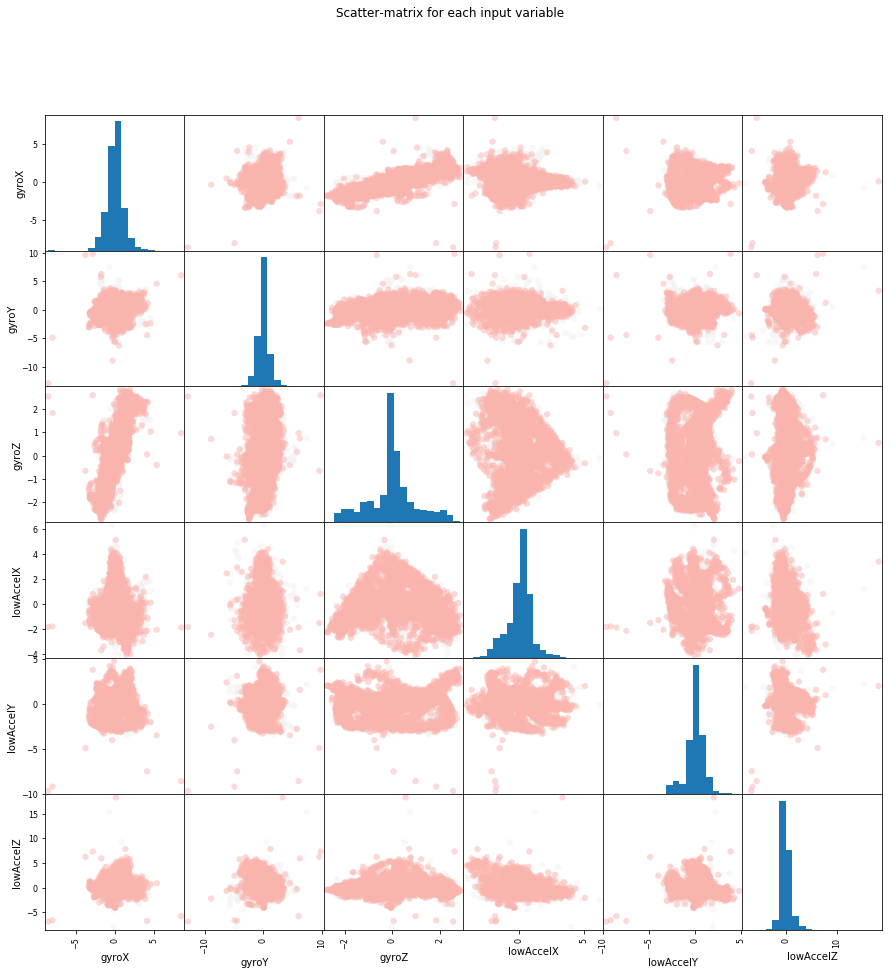

In [22]:
from pandas.tools.plotting import scatter_matrix
from matplotlib import cm
feature_names = ['gyroX','gyroY','gyroZ',
                  'lowAccelX','lowAccelY','lowAccelZ'] 
                  #'highAccelX','highAccelY','highAccelZ'
X = X_train_std[feature_names]
y = y_train['activity']
cmap = cm.get_cmap('Pastel1')
scatter = pd.scatter_matrix(X, c = y, marker = 'o', s=40, hist_kwds={'bins':20}, figsize=(15,15), cmap = cmap)
plt.suptitle('Scatter-matrix for each input variable')
plt.savefig('feature mapping') 

In [23]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
import numpy as np
import matplotlib.pyplot as plt   

In [24]:
!pip install mlxtend 

In [39]:
#from mlxtend.plotting import plot_decision_regions
#import matplotlib.pyplot as plt 
#value = 1.5
#width = 0.75
#plot_decision_regions(X=X_train_std.values, 
                      #y=np.ravel(y_train.values),
                      #filler_feature_values={2: value, 3: value, 4: value, 5: value, 6:value, 7:value, 8:value},  
                      #clf=svm)  

<h4>use KNN</h4> 

In [35]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
knn= KNeighborsClassifier(n_neighbors=4,p=1, metric='minkowski')
y_pred=knn.fit(X_train_std, np.ravel(y_train)).predict(X_test_std)  
print(confusion_matrix(y_test, y_pred).T)
print(classification_report(y_test, y_pred, digits=2))    

[[2605 1019]
 [ 621  956]]
             precision    recall  f1-score   support

          0       0.72      0.81      0.76      3226
          1       0.61      0.48      0.54      1975

avg / total       0.68      0.68      0.68      5201



In [36]:
knn.predict_proba(X_test_std) 

array([[0.5 , 0.5 ],
       [0.25, 0.75],
       [0.5 , 0.5 ],
       ...,
       [1.  , 0.  ],
       [1.  , 0.  ],
       [1.  , 0.  ]])

In [37]:
knn.score(X_train_std, y_train)  
metrics.accuracy_score(y_test,y_pred) 

0.6846760238415689

<h4>use PCA to reduction the dims and extract the important features</h4> 

In [29]:
#use PCA to explore the features on deep dims 
from sklearn.decomposition import PCA 
pca= PCA(n_components=2) 
X_train_pca= pca.fit_transform(X_train_std)
X_test_pca=pca.transform(X_test_std)  
print(X_train_pca.shape,y_train.shape)   

(12135, 2) (12135, 1)


<h4>after transform, using logit regression</h4> 

In [30]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression() 
lr.fit(X_train_pca, np.ravel(y_train))     

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [31]:
lr.coef_ 

array([[0.00875, 0.01933]])

In [32]:
lr.score(X_train_pca, y_train) 

0.6201895344046148

In [33]:
y_pred=lr.predict(X_test_pca) 
print(y_pred) 

[0 0 0 ... 0 0 0]


In [40]:
metrics.accuracy_score(y_test,y_pred)  

0.6846760238415689

<h4>How to start the machine learning tool set up and basic knowledge</h4> 

Jupyter Notebook Command and shortcuts for convenience  
1.	np.info()
2.	np.source() 
3.	h: shows the list of shortcuts
4.	shift+ enter : run the cell 
5.	shift +Tab : first time pressing, tells you what parameters to pass
6.	shift + Tab: press 3 times, give the additional infos about the method 
7.	ESC shift + up arrow : extend select cells above for select multiple cells 
8.	ESC A: insert a new cell above; ESC B: below 
9.	D+D : select the cell and print D twice to delete the cell directly 
10.	ESC M: change the edit mode to markdown; y to change it back to code mode 
11.	Look at document for code or function : ? + function name 
12.	Look at source code for the function: ?? + function name 
13.	Check where the function come from: function name, then shift enter 
14.	Lazy explore, to find out what available parameters that the function can provide, use shift +tab (within function), tab (for the object)  